In [229]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression 
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from geopy.distance import geodesic 

## Red Wine Dataset

In [230]:
df= pd.read_csv("winequality-red.csv")

In [231]:
df.head()

,"fixed acidity;""volatile acidity"";""citric acid"";""residual sugar"";""chlorides"";""free sulfur dioxide"";""total sulfur dioxide"";""density"";""pH"";""sulphates"";""alcohol"";""quality"""
0,7.4;0.7;0;1.9;0.076;11;34;0.9978;3.51;0.56;9.4;5
1,7.8;0.88;0;2.6;0.098;25;67;0.9968;3.2;0.68;9.8;5
2,7.8;0.76;0.04;2.3;0.092;15;54;0.997;3.26;0.65;...
3,11.2;0.28;0.56;1.9;0.075;17;60;0.998;3.16;0.58...
4,7.4;0.7;0;1.9;0.076;11;34;0.9978;3.51;0.56;9.4;5


In [232]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 1 columns):
 #   Column                                                                                                                                                                   Non-Null Count  Dtype 
---  ------                                                                                                                                                                   --------------  ----- 
 0   fixed acidity;"volatile acidity";"citric acid";"residual sugar";"chlorides";"free sulfur dioxide";"total sulfur dioxide";"density";"pH";"sulphates";"alcohol";"quality"  1599 non-null   object
dtypes: object(1)
memory usage: 12.6+ KB


**The dataset appears to be in a CSV format, but the features are separated by semicolons instead of commas. so it needs to be corrected by splitting the single column into multiple columns.**

In [233]:

file_path = 'winequality-red.csv'  
df = pd.read_csv(file_path, delimiter=';')

df.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [234]:
# Saving the dataset to a new CSV file
new_file_path = 'winequality-red-clean.csv'  
df.to_csv(new_file_path, index=False)

print(f"Dataset saved to {new_file_path}")

Dataset saved to winequality-red-clean.csv


In [235]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [236]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


## white Wine Dataset

In [237]:
df2= pd.read_csv("winequality-white.csv")

In [238]:
df2.head()

,"fixed acidity;""volatile acidity"";""citric acid"";""residual sugar"";""chlorides"";""free sulfur dioxide"";""total sulfur dioxide"";""density"";""pH"";""sulphates"";""alcohol"";""quality"""
0,7;0.27;0.36;20.7;0.045;45;170;1.001;3;0.45;8.8;6
1,6.3;0.3;0.34;1.6;0.049;14;132;0.994;3.3;0.49;9...
2,8.1;0.28;0.4;6.9;0.05;30;97;0.9951;3.26;0.44;1...
3,7.2;0.23;0.32;8.5;0.058;47;186;0.9956;3.19;0.4...
4,7.2;0.23;0.32;8.5;0.058;47;186;0.9956;3.19;0.4...


In [239]:

file_path = 'winequality-white.csv'  
df2 = pd.read_csv(file_path, delimiter=';')

df2.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [240]:
# Saving the dataset to a new CSV file
new_file_path = 'winequality-white-clean.csv'  
df2.to_csv(new_file_path, index=False)

print(f"Dataset saved to {new_file_path}")

Dataset saved to winequality-white-clean.csv


## combining the two datasets into one dataset

In [241]:

df['wine_type'] = 'red'
df2['wine_type'] = 'white'

# Combining the two datasets
wq_df = pd.concat([df, df2], ignore_index=True)

# Optionally, saving the combined dataset to a new CSV file
wq_df.to_csv('wine_quality_dataset.csv', index=False)


In [242]:
wq_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [243]:
wq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  wine_type             6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [244]:
wq_df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


## Data Preprocessing

In [104]:
wq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  wine_type             6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [105]:
wq_df['wine_type'].value_counts()

wine_type
white    4898
red      1599
Name: count, dtype: int64

**converting wine type column values to numerical values**

In [245]:
wq_df['wine_type']=wq_df['wine_type'].map({'white':0, 'red':1})
wq_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1


In [246]:
wq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  wine_type             6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 660.0 KB


## Data Cleaning 

In [108]:
wq_df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
wine_type               0
dtype: int64

the Dataset has no missing values 

In [109]:
wq_df.duplicated().sum()

1177

In [247]:
# View the duplicate rows
duplicates = wq_df[wq_df.duplicated()]
duplicates[:100]


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,1
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5,1
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5,1
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.99780,3.33,0.83,10.5,5,1
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.99620,3.41,0.39,10.9,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
716,8.0,0.430,0.36,2.30,0.075,10.0,48.0,0.99760,3.34,0.46,9.4,5,1
720,8.4,0.560,0.04,2.00,0.082,10.0,22.0,0.99760,3.22,0.44,9.6,5,1
728,6.4,0.570,0.02,1.80,0.067,4.0,11.0,0.99700,3.46,0.68,9.5,5,1
736,7.7,0.965,0.10,2.10,0.112,11.0,22.0,0.99630,3.26,0.50,9.5,5,1


In [248]:
# Removing duplicate rows
wq_df= wq_df.drop_duplicates()

wq_df.duplicated().sum()


0

In [249]:
wq_df['quality'].value_counts()

quality
6    2323
5    1752
7     856
4     206
8     148
3      30
9       5
Name: count, dtype: int64

## Analysis & Vesualization

In [250]:
import pandas as pd 
import plotly.express as px 
import seaborn as sns 
import plotly.figure_factory as ff 
import matplotlib.pyplot as plt

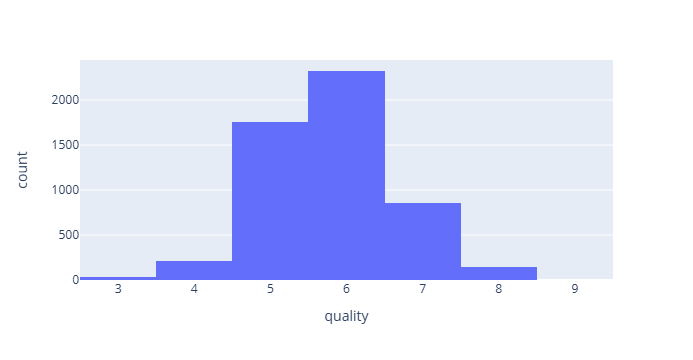

In [28]:
px.histogram(wq_df, x='quality')

<Axes: xlabel='quality', ylabel='count'>

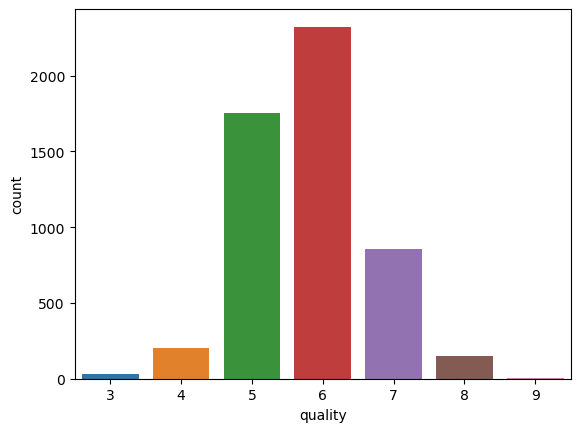

In [29]:
sns.countplot(data=wq_df,x='quality')

In [30]:
wq_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5320 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         5320 non-null   float64
 1   volatile acidity      5320 non-null   float64
 2   citric acid           5320 non-null   float64
 3   residual sugar        5320 non-null   float64
 4   chlorides             5320 non-null   float64
 5   free sulfur dioxide   5320 non-null   float64
 6   total sulfur dioxide  5320 non-null   float64
 7   density               5320 non-null   float64
 8   pH                    5320 non-null   float64
 9   sulphates             5320 non-null   float64
 10  alcohol               5320 non-null   float64
 11  quality               5320 non-null   int64  
 12  wine_type             5320 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 581.9 KB


<Axes: xlabel='wine_type', ylabel='count'>

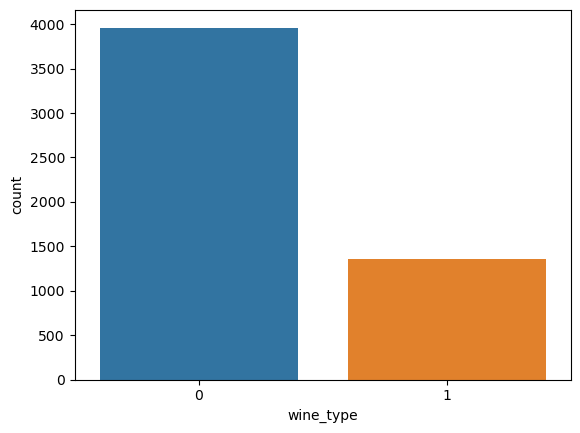

In [31]:
sns.countplot(data=wq_df, x='wine_type')

In [32]:
wq_df['wine_type'].value_counts(normalize= True)

wine_type
0    0.744549
1    0.255451
Name: proportion, dtype: float64

In [33]:
wq_df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'wine_type'],
      dtype='object')

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



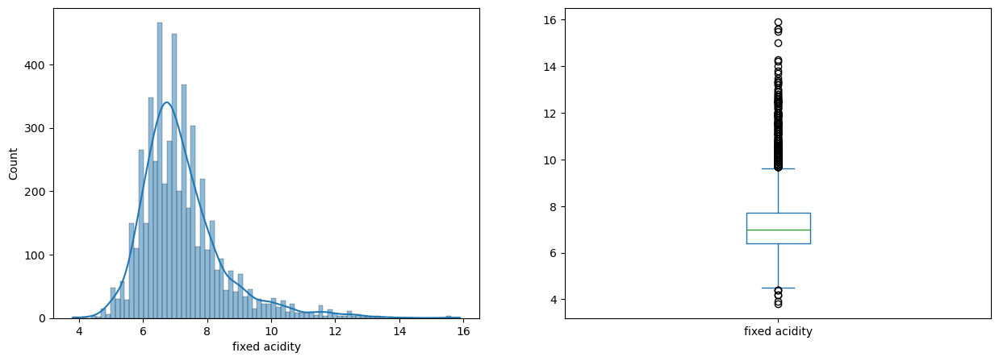

In [34]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['fixed acidity'], kde=True)
plt.subplot(122)
wq_df['fixed acidity'].plot.box(figsize=(15, 5))

plt.show()

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



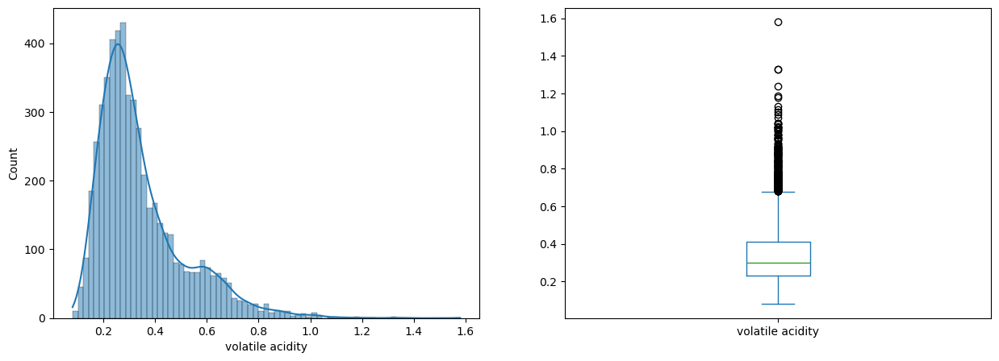

In [35]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['volatile acidity'], kde=True)
plt.subplot(122)
wq_df['volatile acidity'].plot.box(figsize=(15, 5))

plt.show()

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



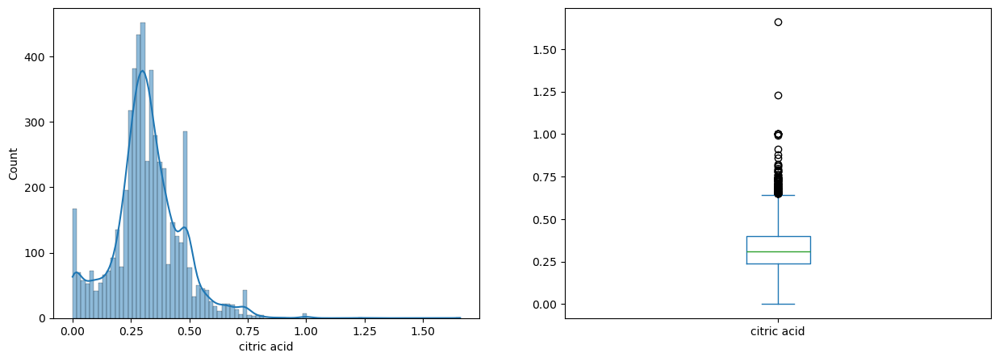

In [36]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['citric acid'], kde=True)
plt.subplot(122)
wq_df['citric acid'].plot.box(figsize=(15, 5))

plt.show()

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



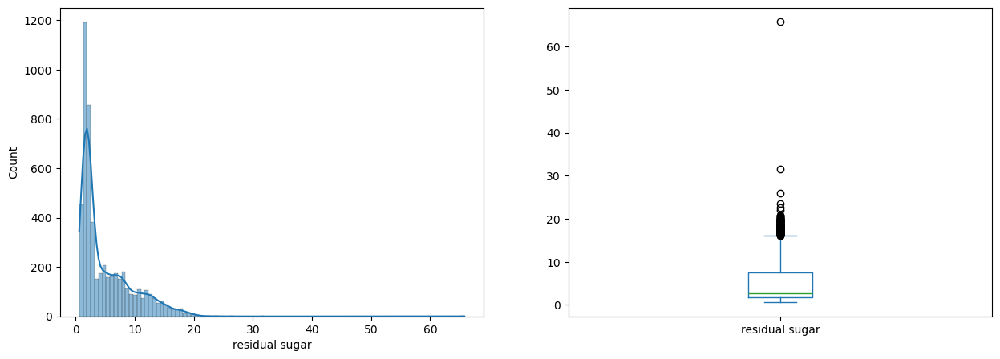

In [37]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['residual sugar'], kde=True)
plt.subplot(122)
wq_df['residual sugar'].plot.box(figsize=(15, 5))

plt.show()

In [38]:
wq_df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'wine_type'],
      dtype='object')

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



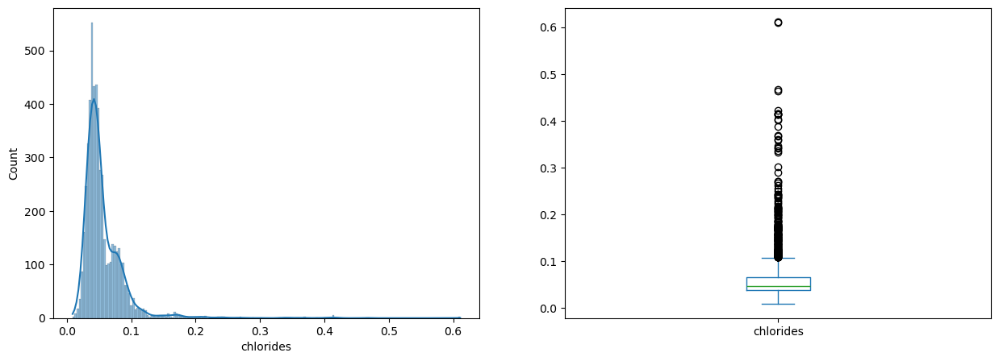

In [39]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['chlorides'], kde=True)
plt.subplot(122)
wq_df['chlorides'].plot.box(figsize=(15, 5))

plt.show()

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



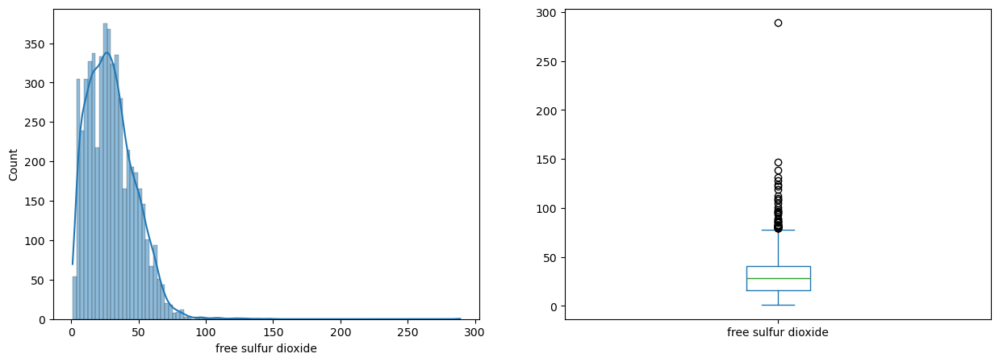

In [40]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['free sulfur dioxide'], kde=True)
plt.subplot(122)
wq_df['free sulfur dioxide'].plot.box(figsize=(15, 5))

plt.show()

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



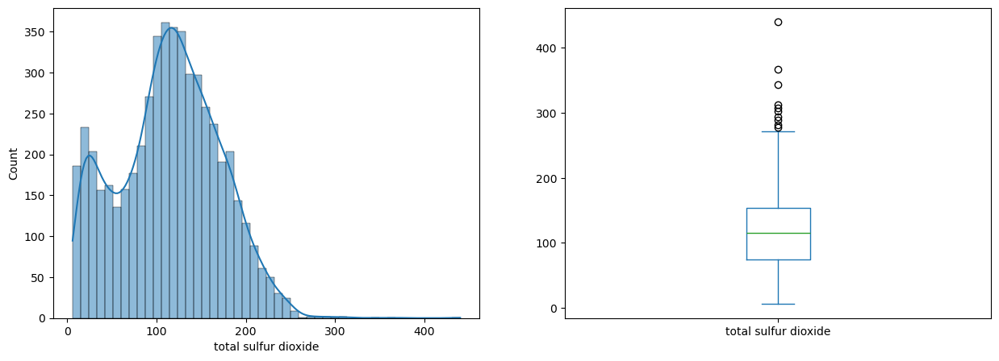

In [41]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['total sulfur dioxide'], kde=True)
plt.subplot(122)
wq_df['total sulfur dioxide'].plot.box(figsize=(15, 5))

plt.show()

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



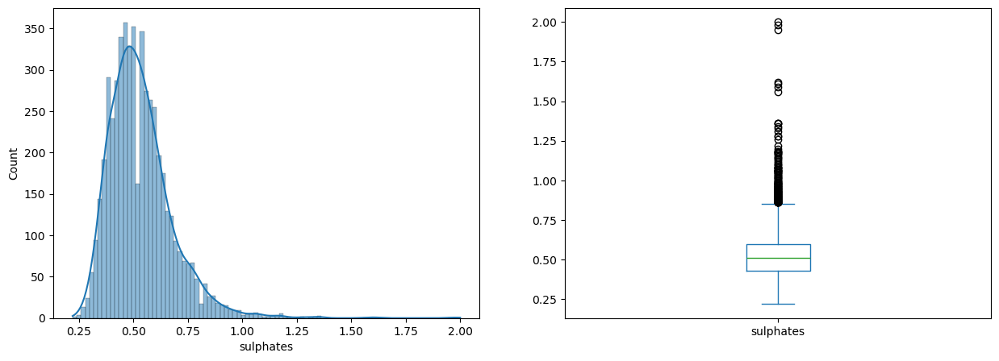

In [42]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['sulphates'], kde=True)
plt.subplot(122)
wq_df['sulphates'].plot.box(figsize=(15, 5))

plt.show()

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



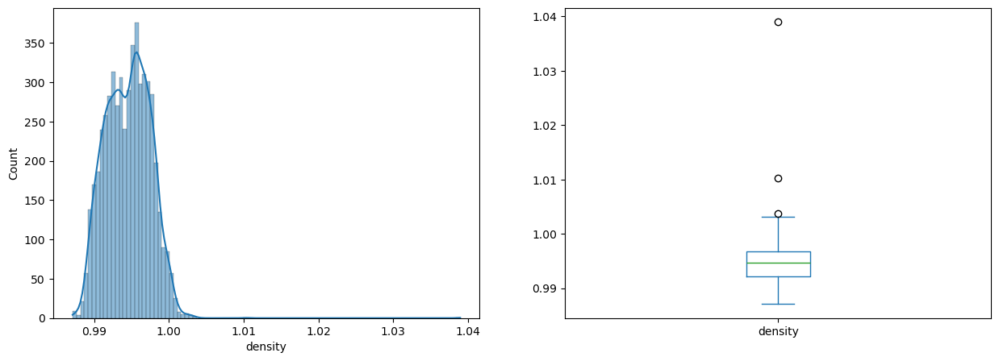

In [43]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['density'], kde=True)
plt.subplot(122)
wq_df['density'].plot.box(figsize=(15, 5))

plt.show()

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



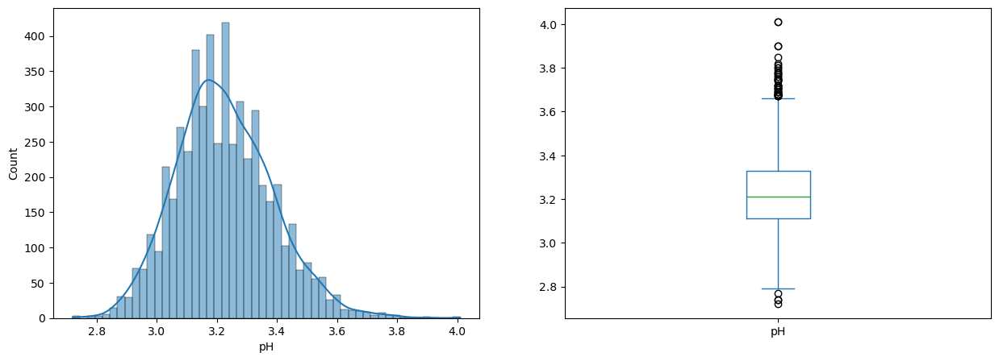

In [44]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['pH'], kde=True)
plt.subplot(122)
wq_df['pH'].plot.box(figsize=(15, 5))

plt.show()

it's known that some wines are deliberately made with higher pH as part of their style or due to regional factors.so we can't conceder the ph values that more than 3.6 as outliers

E:\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



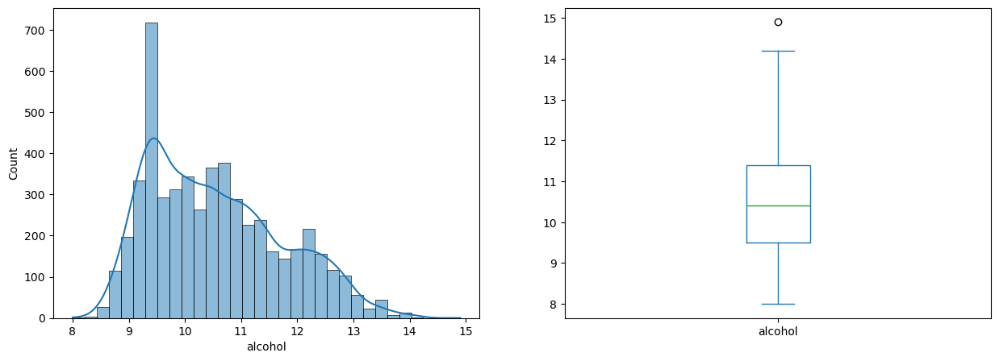

In [45]:

plt.figure(2)
plt.subplot(121)
sns.histplot(wq_df['alcohol'], kde=True)
plt.subplot(122)
wq_df['alcohol'].plot.box(figsize=(15, 5))

plt.show()

**The charts indicate that some of the features contain outliers, so they need to be handled accordingly.**

## Outliers Handeling 

In [251]:
wq_df[wq_df['citric acid']>1.2]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type
2344,7.4,0.20,1.66,2.1,0.022,34.0,113.0,0.99165,3.26,0.55,12.2,6,0
4751,7.6,0.25,1.23,4.6,0.035,51.0,294.0,0.99018,3.03,0.43,13.1,6,0


In [252]:
(wq_df['citric acid']>1.2).sum()/wq_df.shape[0]

0.00037593984962406017

In [253]:
(wq_df['chlorides']>.5).sum()/wq_df.shape[0]

0.00037593984962406017

In [254]:
wq_df.drop(wq_df[wq_df['chlorides']>30].index, inplace=True)

In [255]:
(wq_df['free sulfur dioxide']>160).sum()/wq_df.shape[0]

0.00018796992481203009

In [256]:
wq_df.drop(wq_df[wq_df['free sulfur dioxide']>160].index, inplace=True)

In [257]:
(wq_df['total sulfur dioxide']>300).sum()/wq_df.shape[0]

0.0009400263207369807

In [258]:
wq_df.drop(wq_df[wq_df['total sulfur dioxide']>300].index, inplace=True)

In [259]:
(wq_df['residual sugar']>30).sum()/wq_df.shape[0]

0.0003763643206624012

we can conceder these two values as outliers as it's unusual to observe that much sugar in wine

In [260]:
wq_df.drop(wq_df[wq_df['residual sugar']>30].index, inplace=True)

In [261]:
(wq_df['alcohol']>14).sum()/wq_df.shape[0]

0.0005647590361445783

In [262]:
wq_df.drop(wq_df[wq_df['alcohol']>30].index, inplace=True)

In [263]:
wq_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,1


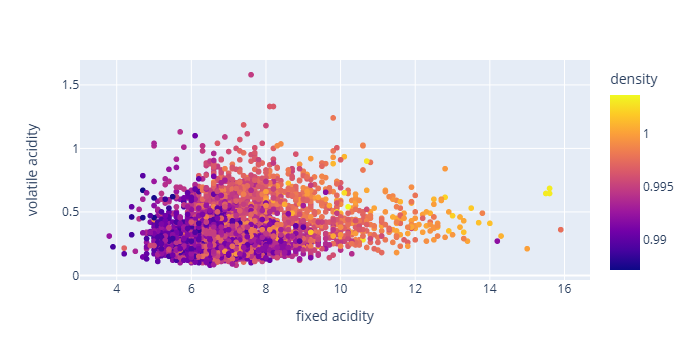

In [264]:
px.scatter(wq_df, x= 'fixed acidity', y= 'volatile acidity', color= 'density')

px.scatter(wq_df, x= 'alcohol', y= 'quality', color= 'pH')

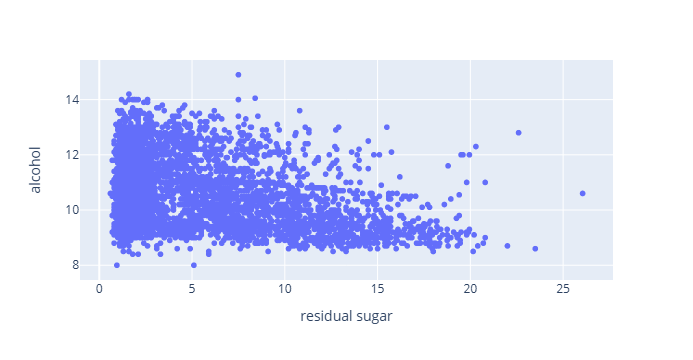

In [137]:
px.scatter(wq_df, x= 'residual sugar', y= 'alcohol')

It seems that as the sugar content in the wine increases, the alcohol content decreases. This suggests that this inverse relationship could be useful for creating a new feature through feature engineering.

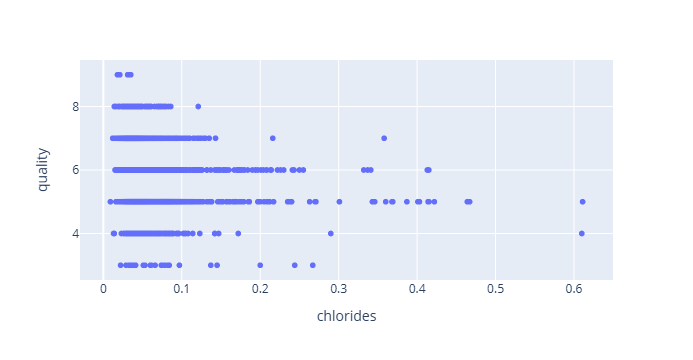

In [138]:
px.scatter(wq_df, x= 'chlorides', y= 'quality')

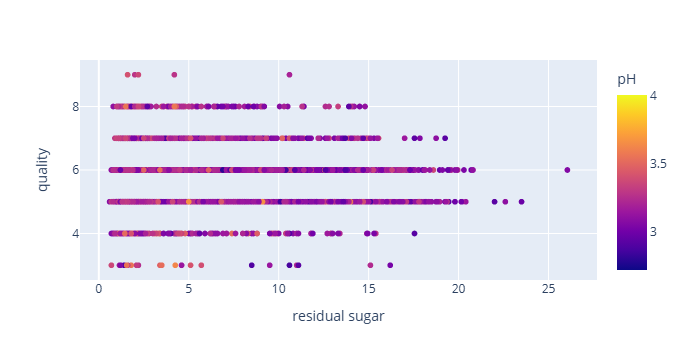

In [62]:
px.scatter(wq_df, x= 'residual sugar', y= 'quality', color= 'pH')

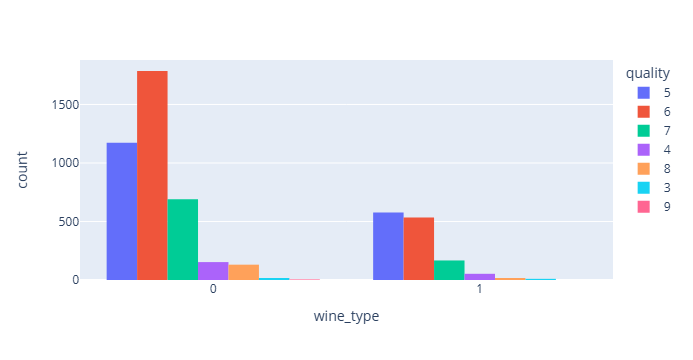

In [63]:
px.histogram(wq_df, x='wine_type' , color='quality', barmode='group')

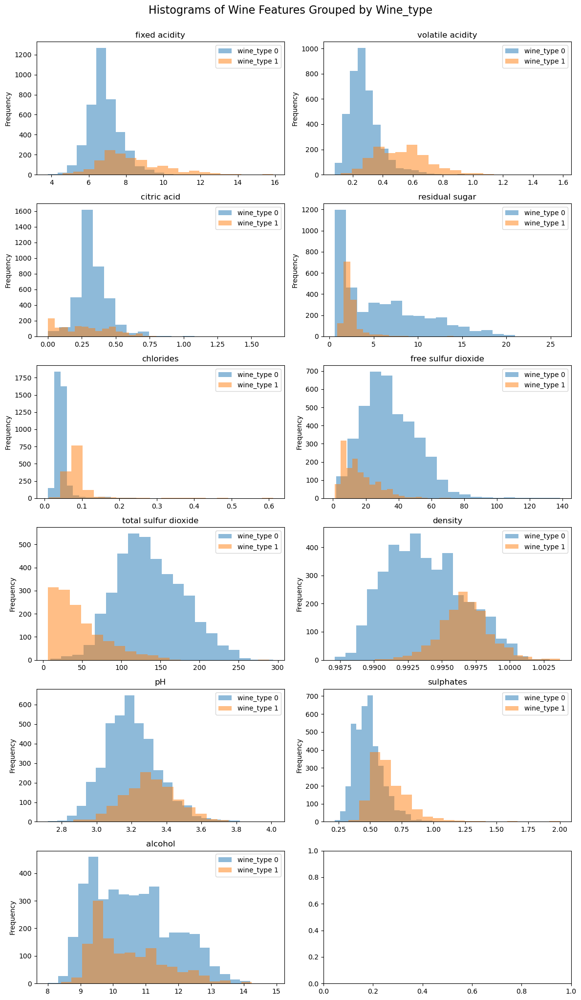

In [122]:

feature_columns = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
                   'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
                   'pH', 'sulphates', 'alcohol']

num_features = len(feature_columns)
rows = num_features // 2 + num_features % 2  # Two histograms per row


fig, axes = plt.subplots(rows, 2, figsize=(12, 20))
axes = axes.flatten()

# Plotting histograms grouped by 'wine_type'
for i, feature in enumerate(feature_columns):
    ax = axes[i]
    for wine_type in sorted(wq_df['wine_type'].unique()):
        wq_df[wq_df['wine_type'] == wine_type][feature].plot(kind='hist', bins=20, alpha=0.5, ax=ax, label=f'wine_type {wine_type}')
    ax.set_title(f'{feature}')
    ax.legend()

plt.tight_layout()
plt.suptitle("Histograms of Wine Features Grouped by Wine_type", y=1.02, fontsize=16)
plt.show()



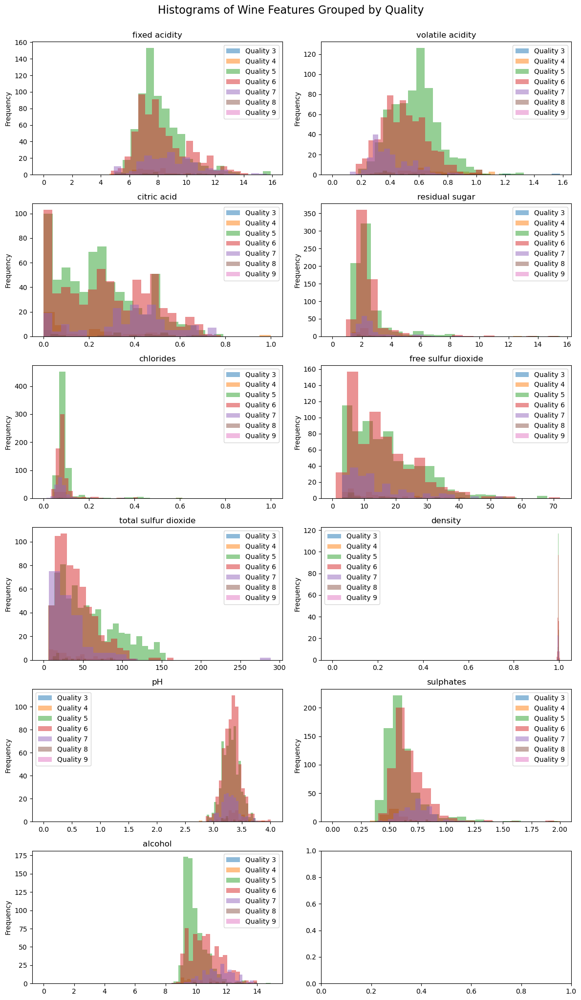

In [67]:

feature_columns = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
                 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
                 'pH', 'sulphates', 'alcohol']

num_features = len(feature_columns)
rows = num_features // 2 + num_features % 2  # Two histograms per row


fig, axes = plt.subplots(rows, 2, figsize=(12, 20))
axes = axes.flatten()

# Plotting histograms grouped by 'quality'
for i, feature in enumerate(feature_columns):
    ax = axes[i]
    for quality in sorted(wq_df['quality'].unique()):
        df[df['quality'] == quality][feature].plot(kind='hist', bins=20, alpha=0.5, ax=ax, label=f'Quality {quality}')
    ax.set_title(f'{feature}')
    ax.legend()

plt.tight_layout()
plt.suptitle("Histograms of Wine Features Grouped by Quality", y=1.02, fontsize=16)
plt.show()

In [68]:
wq_df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'wine_type'],
      dtype='object')

## Feature Engineering

In [265]:
# Acidity Ratios
wq_df['acidity_ratio'] = wq_df['fixed acidity'] / wq_df['volatile acidity']
wq_df['citric_acid_ratio'] = wq_df['citric acid'] / (wq_df['fixed acidity'] + wq_df['volatile acidity'])

In [266]:
# Sulfur Dioxide Ratios
wq_df['sulfur_dioxide_ratio'] = wq_df['free sulfur dioxide'] / wq_df['total sulfur dioxide']


In [267]:
# Sugar/Alcohol Ratio
wq_df['sugar_alcohol_ratio'] = wq_df['residual sugar'] / wq_df['alcohol']

In [268]:
# Adding squared features
wq_df['alcohol_squared'] =wq_df['alcohol'] ** 2
wq_df['density_squared'] = wq_df['density'] ** 2
wq_df['volatile_acidity_squared'] =wq_df['volatile acidity'] ** 2
wq_df['chlorides_squared'] = wq_df['chlorides'] ** 2


In [269]:
# Create interaction terms 
wq_df['alcohol_density_interaction'] =wq_df ['alcohol'] *wq_df['density']


In [270]:

# Apply log transformation
wq_df['log_residual_sugar'] = np.log1p(wq_df['residual sugar'])


In [271]:
wq_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,...,acidity_ratio,citric_acid_ratio,sulfur_dioxide_ratio,sugar_alcohol_ratio,alcohol_squared,density_squared,volatile_acidity_squared,chlorides_squared,alcohol_density_interaction,log_residual_sugar
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,...,10.571429,0.000000,0.323529,0.202128,88.36,0.995605,0.4900,0.005776,9.37932,1.064711
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,...,8.863636,0.000000,0.373134,0.265306,96.04,0.993610,0.7744,0.009604,9.76864,1.280934
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,...,10.263158,0.004673,0.277778,0.234694,96.04,0.994009,0.5776,0.008464,9.77060,1.193922
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,...,40.000000,0.048780,0.283333,0.193878,96.04,0.996004,0.0784,0.005625,9.78040,1.064711
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,...,11.212121,0.000000,0.325000,0.191489,88.36,0.995605,0.4356,0.005625,9.37932,1.029619


In [134]:
wq_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5312 entries, 0 to 6496
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   fixed acidity                5312 non-null   float64
 1   volatile acidity             5312 non-null   float64
 2   citric acid                  5312 non-null   float64
 3   residual sugar               5312 non-null   float64
 4   chlorides                    5312 non-null   float64
 5   free sulfur dioxide          5312 non-null   float64
 6   total sulfur dioxide         5312 non-null   float64
 7   density                      5312 non-null   float64
 8   pH                           5312 non-null   float64
 9   sulphates                    5312 non-null   float64
 10  alcohol                      5312 non-null   float64
 11  quality                      5312 non-null   int64  
 12  wine_type                    5312 non-null   int64  
 13  acidity_ratio          

In [135]:
wq_df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,...,acidity_ratio,citric_acid_ratio,sulfur_dioxide_ratio,sugar_alcohol_ratio,alcohol_squared,density_squared,volatile_acidity_squared,chlorides_squared,alcohol_density_interaction,log_residual_sugar
count,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,...,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000,5312.000000
mean,7.214561,0.343971,0.318483,5.031363,0.056685,29.936653,113.827184,0.994523,3.224637,0.533300,...,25.074090,0.042563,0.287000,0.498146,112.701342,0.989084,0.146573,0.004574,10.489479,1.566631
std,1.320114,0.168115,0.147198,4.407767,0.036888,17.314982,56.247842,0.002895,0.160405,0.149775,...,10.673276,0.019133,0.125833,0.468189,25.841413,0.005758,0.164555,0.013078,1.157903,0.658542
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,...,4.807692,0.000000,0.022727,0.056604,64.000000,0.974386,0.006400,0.000081,7.946560,0.470004
25%,6.400000,0.230000,0.240000,1.800000,0.038000,16.000000,74.000000,0.992200,3.110000,0.430000,...,17.453685,0.033435,0.201303,0.163462,90.250000,0.984461,0.052900,0.001444,9.477200,1.029619
50%,7.000000,0.300000,0.310000,2.700000,0.047000,28.000000,116.000000,0.994640,3.210000,0.510000,...,23.750000,0.042755,0.269133,0.259808,108.160000,0.989309,0.090000,0.002209,10.328656,1.308333
75%,7.700000,0.410000,0.400000,7.500000,0.066000,41.000000,153.000000,0.996762,3.330000,0.600000,...,30.879447,0.051924,0.350000,0.723956,129.960000,0.993535,0.168100,0.004356,11.291273,2.140066
max,15.900000,1.580000,1.660000,26.050000,0.611000,138.500000,294.000000,1.003690,4.010000,2.000000,...,90.000000,0.218421,0.857143,2.732558,222.010000,1.007394,2.496400,0.373321,14.864240,3.297687


**some scatter plots between the target columns and other features**

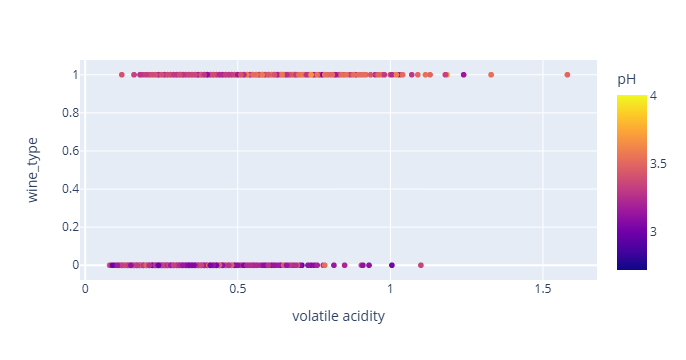

In [126]:
px.scatter(wq_df, x= 'volatile acidity', y= 'wine_type', color= 'pH')

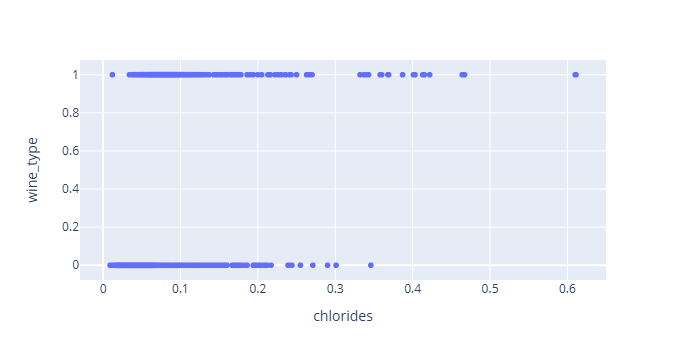

In [127]:
px.scatter(wq_df, x= 'chlorides', y= 'wine_type')

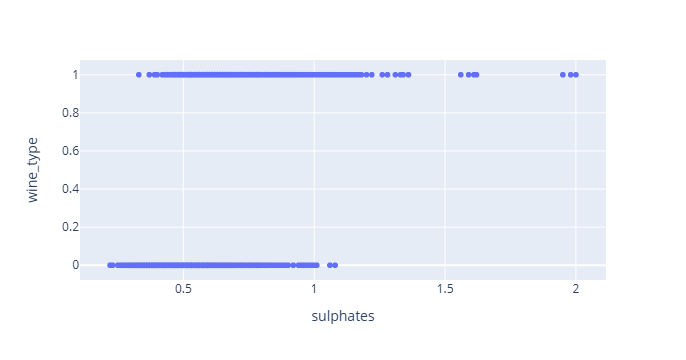

In [128]:
px.scatter(wq_df, x= 'sulphates', y= 'wine_type')

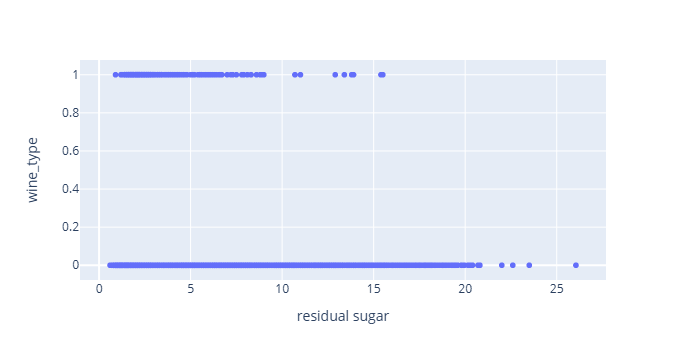

In [129]:
px.scatter(wq_df, x= 'residual sugar', y= 'wine_type')

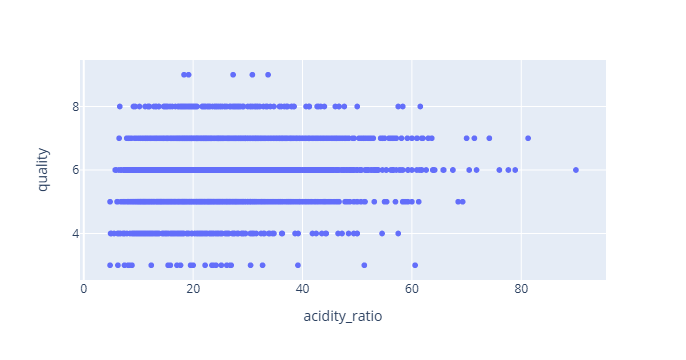

In [85]:
px.scatter(wq_df, x= 'acidity_ratio', y= 'quality')

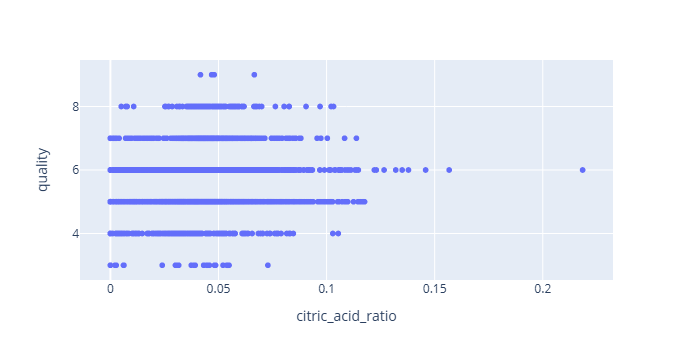

In [86]:
px.scatter(wq_df, x= 'citric_acid_ratio', y= 'quality')

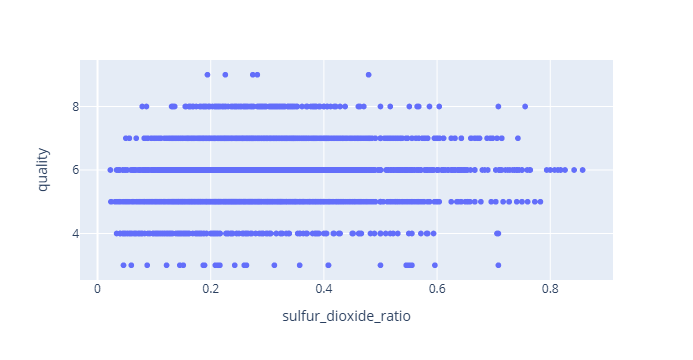

In [87]:
px.scatter(wq_df, x= 'sulfur_dioxide_ratio', y= 'quality')

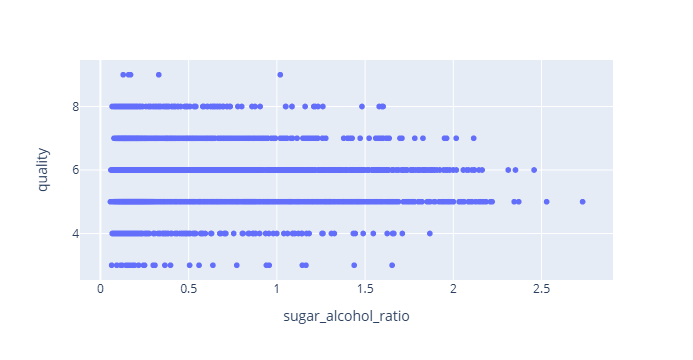

In [88]:
px.scatter(wq_df, x= 'sugar_alcohol_ratio', y= 'quality')

## Wine Type Classification

**Feature Selection**

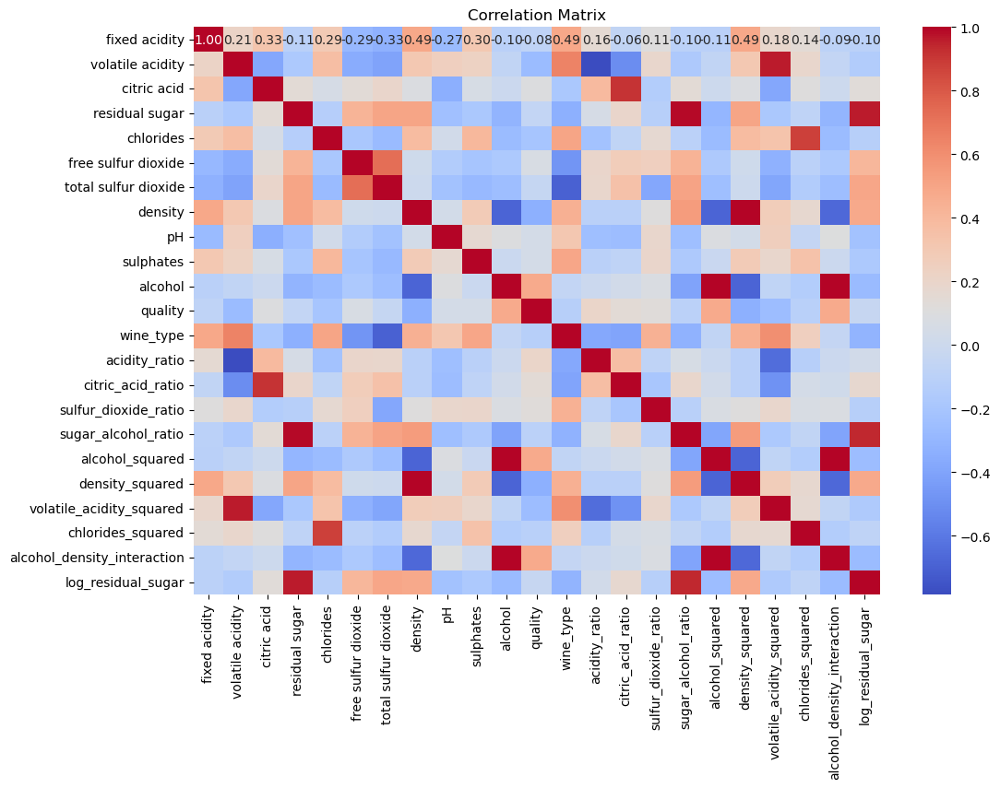

wine_type                      1.000000
volatile acidity               0.647054
volatile_acidity_squared       0.595989
chlorides                      0.499758
sulphates                      0.490977
fixed acidity                  0.486856
density                        0.442825
density_squared                0.442803
sulfur_dioxide_ratio           0.440321
pH                             0.311282
chlorides_squared              0.252355
alcohol_density_interaction   -0.046853
alcohol                       -0.057985
alcohol_squared               -0.061226
quality                       -0.116499
citric acid                   -0.183848
log_residual_sugar            -0.311927
sugar_alcohol_ratio           -0.318811
residual sugar                -0.333649
acidity_ratio                 -0.379193
citric_acid_ratio             -0.401926
free sulfur dioxide           -0.475593
total sulfur dioxide          -0.698496
Name: wine_type, dtype: float64


In [272]:

corr_matrix = wq_df.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

corr_with_wine_type = corr_matrix['wine_type'].sort_values(ascending=False)
print(corr_with_wine_type)

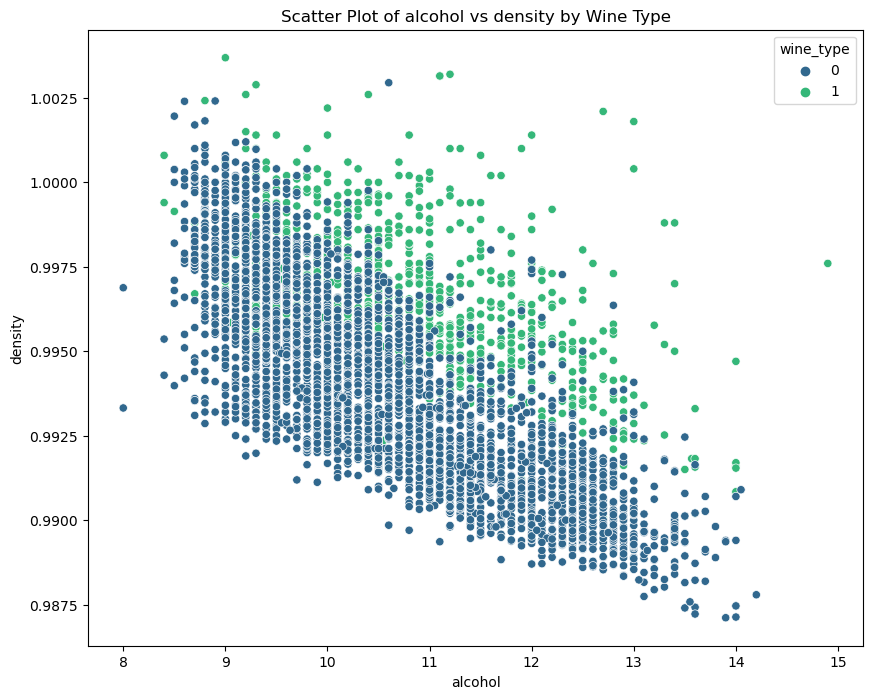

In [273]:

feature_x = 'alcohol'
feature_y = 'density'

plt.figure(figsize=(10, 8))
sns.scatterplot(x=feature_x, y=feature_y, hue='wine_type', data=wq_df, palette='viridis')
plt.title(f'Scatter Plot of {feature_x} vs {feature_y} by Wine Type')
plt.show()


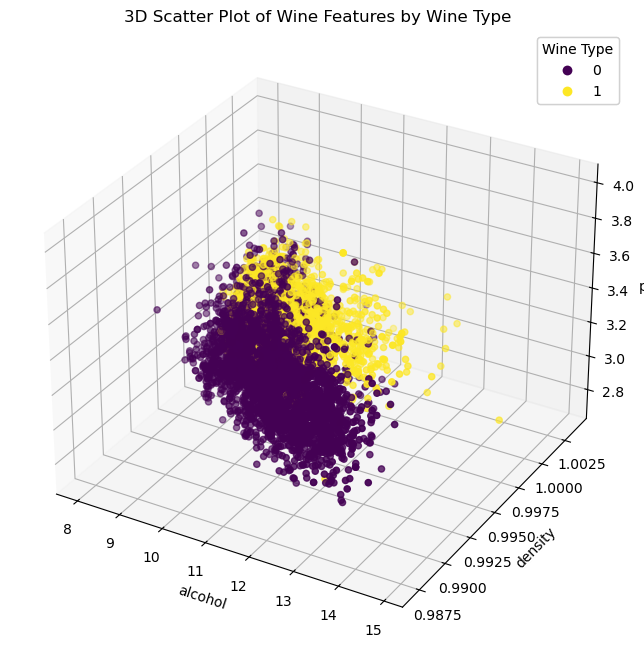

In [125]:

from mpl_toolkits.mplot3d import Axes3D

# Define three features to plot
feature_x = 'alcohol'
feature_y = 'density'
feature_z = 'pH'

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plotting the points
scatter = ax.scatter(wq_df[feature_x], wq_df[feature_y], wq_df[feature_z], 
                     c=wq_df['wine_type'], cmap='viridis')

# Adding labels and title
ax.set_xlabel(feature_x)
ax.set_ylabel(feature_y)
ax.set_zlabel(feature_z)
ax.set_title('3D Scatter Plot of Wine Features by Wine Type')

# Adding a legend
legend1 = ax.legend(*scatter.legend_elements(), title="Wine Type")
ax.add_artist(legend1)

plt.show()


In [101]:
wq_df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'wine_type', 'acidity_ratio',
       'citric_acid_ratio', 'sulfur_dioxide_ratio', 'sugar_alcohol_ratio',
       'alcohol_squared', 'density_squared', 'volatile_acidity_squared',
       'chlorides_squared', 'alcohol_density_interaction',
       'log_residual_sugar'],
      dtype='object')

In [274]:
from sklearn.model_selection import train_test_split

X1 = wq_df[['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates','quality', 'acidity_ratio',
       'citric_acid_ratio', 'sulfur_dioxide_ratio', 'sugar_alcohol_ratio',
       'density_squared', 'volatile_acidity_squared',
       'chlorides_squared',
       'log_residual_sugar']]
y1 = wq_df['wine_type']

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, random_state=42)

print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")


X_train shape: (3718, 14)
y_train shape: (3718,)


**Logistic Regression**

In [275]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight

# Adjusting class weights
logreg = LogisticRegression(max_iter=1000, class_weight='balanced')
logreg.fit(X1_train, y1_train)

train_acc_logreg= logreg.score(X1_train,y1_train)
test_acc_logreg= logreg.score(X1_test,y1_test)
print(f"Logistic Regression : Training :{train_acc_logreg} - Testing :{test_acc_logreg}")

y_pred_logreg = logreg.predict(X1_test)

print("Logistic Regression with Class Weights")
print(classification_report(y1_test, y_pred_logreg, zero_division=0))


Logistic Regression : Training :0.9814416352877892 - Testing :0.9786700125470514
Logistic Regression with Class Weights
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1163
           1       0.95      0.98      0.96       431

    accuracy                           0.98      1594
   macro avg       0.97      0.98      0.97      1594
weighted avg       0.98      0.98      0.98      1594



**KNN**

In [276]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize the KNN model
knn_clf = KNeighborsClassifier(n_neighbors=5) 

# Fit the model on the resampled training data
knn_clf.fit(X1_train, y1_train)

# Evaluate the model
train_acc_knn = knn_clf.score(X1_train, y1_train)
test_acc_knn = knn_clf.score(X1_test, y1_test)

print(f"K-Nearest Neighbors : Training :{train_acc_knn} - Testing :{test_acc_knn}")

# Predict on the test set
y_pred_knn = knn_clf.predict(X1_test)

print("K-Nearest Neighbors Classifier")
print(classification_report(y1_test, y_pred_knn, zero_division=0))


K-Nearest Neighbors : Training :0.9596557288864981 - Testing :0.9454203262233375
K-Nearest Neighbors Classifier
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1163
           1       0.92      0.87      0.90       431

    accuracy                           0.95      1594
   macro avg       0.94      0.92      0.93      1594
weighted avg       0.94      0.95      0.94      1594



**Decision Tree** 

In [277]:
from sklearn.tree import DecisionTreeClassifier

dtree = DecisionTreeClassifier(random_state=42)
dtree.fit(X1_train, y1_train)


train_acc_dtree= dtree.score(X1_train,y1_train)
test_acc_dtree= dtree.score(X1_test,y1_test)
print(f"Decision Tree : Training :{train_acc_dtree} - Testing :{test_acc_dtree}")

y_pred_dtree = dtree.predict(X1_test)
print("Decision Tree Classifier")
print(classification_report(y1_test, y_pred_dtree))


Decision Tree : Training :0.9994620763851533 - Testing :0.9836888331242158
Decision Tree Classifier
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1163
           1       0.97      0.97      0.97       431

    accuracy                           0.98      1594
   macro avg       0.98      0.98      0.98      1594
weighted avg       0.98      0.98      0.98      1594



**Random Forest**

In [278]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators= 400, max_depth= 40)
rfc.fit(X1_train, y1_train)

train_acc_rf= rfc.score(X1_train,y1_train)
test_acc_rf= rfc.score(X1_test,y1_test)
print(f"Random Forest : Training :{train_acc_rf} - Testing :{test_acc_rf}")

y_pred_rfc = rfc.predict(X1_test)

print("Random Forest Classifier with Balanced Class Weights")
print(classification_report(y1_test, y_pred_rfc, zero_division=0))

Random Forest : Training :0.9994620763851533 - Testing :0.9937264742785445
Random Forest Classifier with Balanced Class Weights
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1163
           1       1.00      0.98      0.99       431

    accuracy                           0.99      1594
   macro avg       0.99      0.99      0.99      1594
weighted avg       0.99      0.99      0.99      1594



**SVM**

In [284]:
from sklearn.svm import SVC

svc = SVC(max_iter=1000, random_state=52,degree=1)
svc.fit(X1_train, y1_train)

train_acc_svc= svc.score(X1_train,y1_train)
test_acc_svc= svc.score(X1_test,y1_test)

print(f"Support Vector Machine : Training :{train_acc_svc} - Testing :{test_acc_svc}")

y_pred_svc = svc.predict(X1_test)

print("Support Vector Machine with Increased Iterations")
print(classification_report(y1_test, y_pred_svc, zero_division=0))

Support Vector Machine : Training :0.9392146315223239 - Testing :0.9385194479297365
Support Vector Machine with Increased Iterations
              precision    recall  f1-score   support

           0       0.93      0.99      0.96      1163
           1       0.95      0.81      0.88       431

    accuracy                           0.94      1594
   macro avg       0.94      0.90      0.92      1594
weighted avg       0.94      0.94      0.94      1594



**Gradient Boostin**

In [285]:
from sklearn.ensemble import GradientBoostingClassifier

gboost_clf = GradientBoostingClassifier(n_estimators=200, max_depth=3, random_state=42)
gboost_clf.fit(X1_train, y1_train)

train_acc_gb= gboost_clf.score(X1_train,y1_train)
test_acc_gb= gboost_clf.score(X1_test,y1_test)

print(f"Gradient Boosting : Training :{train_acc_gb} - Testing :{test_acc_gb}")

y_pred_gboost = gboost_clf.predict(X1_test)

print("Gradient Boosting Classifier")
print(classification_report(y1_test, y_pred_gboost, zero_division=0))

Gradient Boosting : Training :0.9994620763851533 - Testing :0.9937264742785445
Gradient Boosting Classifier
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1163
           1       1.00      0.98      0.99       431

    accuracy                           0.99      1594
   macro avg       0.99      0.99      0.99      1594
weighted avg       0.99      0.99      0.99      1594



**XGBoodting**

In [286]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

xgb_clf = XGBClassifier(n_estimators=200, max_depth=3, random_state=42, eval_metric='mlogloss')

xgb_clf.fit(X1_train, y1_train)

train_acc_xgb = xgb_clf.score(X1_train, y1_train)
test_acc_xgb = xgb_clf.score(X1_test, y1_test)

print(f"XGBoost Classifier: Training Accuracy: {train_acc_xgb} - Testing Accuracy: {test_acc_xgb}")

y_pred_xgb = xgb_clf.predict(X1_test)

print("XGBoost Classifier")
print(classification_report(y1_test, y_pred_xgb, zero_division=0))


XGBoost Classifier: Training Accuracy: 0.9994620763851533 - Testing Accuracy: 0.9943538268506901
XGBoost Classifier
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1163
           1       1.00      0.98      0.99       431

    accuracy                           0.99      1594
   macro avg       0.99      0.99      0.99      1594
weighted avg       0.99      0.99      0.99      1594



## Results Summary

In [287]:

# Summary of Results
results = {
    'Model': ['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest',
              'Support Vector Machine', 'Gradient Boosting', 'XGBoosting'],
    'Training Accuracy': [train_acc_logreg, train_acc_knn, train_acc_dtree,train_acc_rf,
                          train_acc_svc,train_acc_gb,train_acc_xgb ],
    'Testing Accuracy': [test_acc_logreg, test_acc_knn, test_acc_dtree,test_acc_rf,
                         test_acc_svc,test_acc_gb,test_acc_xgb]
}

import pandas as pd
results_df = pd.DataFrame(results)
print("\nSummary of Model Performance:")
results_df



Summary of Model Performance:


,Model,Training Accuracy,Testing Accuracy
0,Logistic Regression,0.981442,0.978670
1,KNN,0.959656,0.945420
2,Decision Tree,0.999462,0.983689
3,Random Forest,0.999462,0.993726
4,Support Vector Machine,0.939215,0.938519
5,Gradient Boosting,0.999462,0.993726
6,XGBoosting,0.999462,0.994354


**training model for deployment**

In [291]:
X2 = wq_df[[ 'volatile acidity','chlorides']]
y2 = wq_df['wine_type']

X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.3, random_state=42)


In [292]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize the KNN model
knn_clf2 = KNeighborsClassifier(n_neighbors=5) 

# Fit the model on the resampled training data
knn_clf2.fit(X2_train, y2_train)

# Evaluate the model
train_acc_knn = knn_clf2.score(X2_train, y2_train)
test_acc_knn = knn_clf2.score(X2_test, y2_test)

print(f"K_Nearest Neighbors : Training :{train_acc_knn} - Testing :{test_acc_knn}")

# Predict on the test set
y2_pred_knn = knn_clf2.predict(X2_test)

print("K_Nearest Neighbors Classifier")
print(classification_report(y2_test, y2_pred_knn, zero_division=0))


K_Nearest Neighbors : Training :0.9467455621301775 - Testing :0.9259723964868256
K_Nearest Neighbors Classifier
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      1163
           1       0.88      0.84      0.86       431

    accuracy                           0.93      1594
   macro avg       0.91      0.90      0.90      1594
weighted avg       0.93      0.93      0.93      1594



In [293]:
import pickle

# Save the KNN model
with open("k_nearest_neighbors.pkl", "wb") as file:
    pickle.dump(knn_clf2, file)



## Quality Prediction 

## Feature Selection

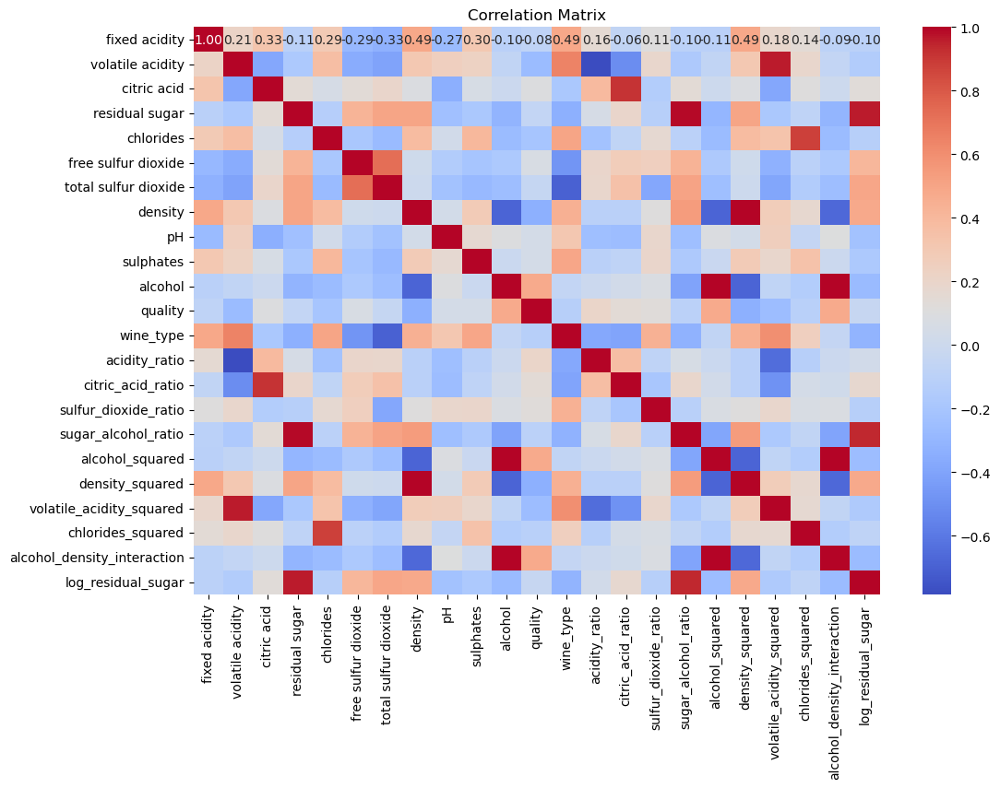

quality                        1.000000
alcohol                        0.471236
alcohol_squared                0.470909
alcohol_density_interaction    0.470697
acidity_ratio                  0.203015
citric_acid_ratio              0.142848
sulfur_dioxide_ratio           0.126565
citric acid                    0.097628
free sulfur dioxide            0.070643
sulphates                      0.042493
pH                             0.040034
log_residual_sugar            -0.034128
total sulfur dioxide          -0.040934
residual sugar                -0.058449
fixed acidity                 -0.080105
sugar_alcohol_ratio           -0.102216
chlorides_squared             -0.109881
wine_type                     -0.116499
chlorides                     -0.202968
volatile_acidity_squared      -0.257642
volatile acidity              -0.265675
density_squared               -0.335723
density                       -0.335949
Name: quality, dtype: float64


In [294]:
import seaborn as sns
import matplotlib.pyplot as plt

# Computimg the correlation matrix
corr_matrix = wq_df.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

#correlation of features with the target variable 'quality'
corr_with_quality = corr_matrix['quality'].sort_values(ascending=False)
print(corr_with_quality)


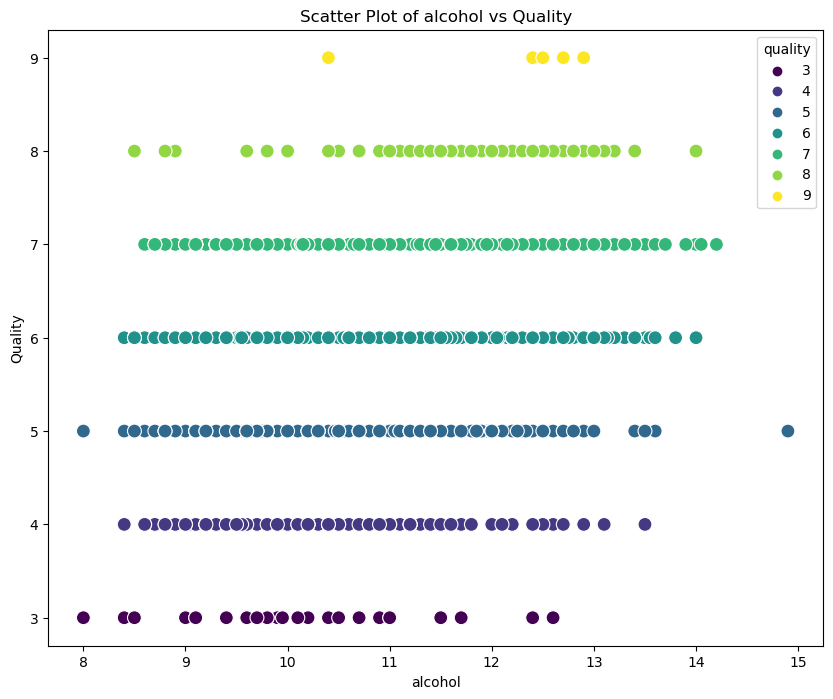

In [137]:
feature = 'alcohol'

plt.figure(figsize=(10, 8))
sns.scatterplot(x=wq_df[feature], y=wq_df['quality'], hue=wq_df['quality'], palette='viridis', s=100)
plt.title(f'Scatter Plot of {feature} vs Quality')
plt.xlabel(f'{feature}')
plt.ylabel('Quality')
plt.show()


In [313]:
from sklearn.model_selection import train_test_split

X = wq_df[[ 'volatile acidity', 'chlorides', 'density', 'alcohol', 'acidity_ratio', 'citric_acid_ratio',
            'sulfur_dioxide_ratio', 'sugar_alcohol_ratio', 'alcohol_squared', 'density_squared',
            'volatile_acidity_squared', 'chlorides_squared', 'alcohol_density_interaction', 'log_residual_sugar']]
y = wq_df['quality']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")


X_train shape: (3718, 14)
y_train shape: (3718,)


In [314]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight

# Adjusting class weights
logreg = LogisticRegression(max_iter=1000, class_weight='balanced')
logreg.fit(X_train, y_train)

train_acc= logreg.score(X_train,y_train)
test_acc= logreg.score(X_test,y_test)
print(f"Logistic Regression : Training :{train_acc} - Testing :{test_acc}")

y_pred_logreg = logreg.predict(X_test)

print("Logistic Regression with Class Weights")
print(classification_report(y_test, y_pred_logreg, zero_division=0))


Logistic Regression : Training :0.3776223776223776 - Testing :0.3958594730238394
Logistic Regression with Class Weights
              precision    recall  f1-score   support

           4       0.13      0.48      0.20        65
           5       0.59      0.56      0.57       552
           6       0.53      0.30      0.39       651
           7       0.35      0.26      0.30       293
           8       0.08      0.58      0.14        33

    accuracy                           0.40      1594
   macro avg       0.34      0.43      0.32      1594
weighted avg       0.49      0.40      0.42      1594



E:\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [315]:
wq_df["quality"].value_counts()

quality
6    2321
5    1749
7     856
4     233
8     153
Name: count, dtype: int64

Given that some classes in the target column have a small amount of data, and the precision and F1 score suggest that the model is unable to learn effectively from these small quantities, we can perform oversampling to increase the number of points in the minority classes.

In [316]:
#over sampling
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler

smote = SMOTE(random_state=42, k_neighbors=2)

X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Check shapes after resampling
print(f"Resampled X_train_res shape: {X_train_res.shape}")
print(f"Resampled y_train_res shape: {y_train_res.shape}")

Resampled X_train_res shape: (8350, 14)
Resampled y_train_res shape: (8350,)


In [317]:
logreg = LogisticRegression(max_iter=1000, class_weight='balanced')
logreg.fit(X_train_res, y_train_res)

train_acc= logreg.score(X_train_res,y_train_res)
test_acc= logreg.score(X_test,y_test)
print(f"Logistic Regression : Training :{train_acc} - Testing :{test_acc}")

y_pred_logreg = logreg.predict(X_test)

print("Logistic Regression with Class Weights")
print(classification_report(y_test, y_pred_logreg, zero_division=0))


Logistic Regression : Training :0.4468263473053892 - Testing :0.3877038895859473
Logistic Regression with Class Weights
              precision    recall  f1-score   support

           4       0.12      0.49      0.19        65
           5       0.59      0.55      0.57       552
           6       0.53      0.28      0.37       651
           7       0.36      0.27      0.31       293
           8       0.08      0.58      0.14        33

    accuracy                           0.39      1594
   macro avg       0.33      0.43      0.32      1594
weighted avg       0.49      0.39      0.41      1594



E:\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In the following steps, I combined the minority classes together to create classes with a larger amount of data.

In [318]:
# Combine classes 8 and 9 into 8, and 3 and 4 into 4
wq_df['quality'] = wq_df['quality'].replace({9: 8, 3: 4})



In [319]:
print(wq_df['quality'].value_counts())


quality
6    2321
5    1749
7     856
4     233
8     153
Name: count, dtype: int64


In [320]:

X = wq_df[[ 'volatile acidity', 'chlorides', 'density', 'alcohol', 'acidity_ratio', 'citric_acid_ratio',
            'sulfur_dioxide_ratio', 'sugar_alcohol_ratio', 'alcohol_squared', 'density_squared',
            'volatile_acidity_squared', 'chlorides_squared', 'alcohol_density_interaction', 'log_residual_sugar']]
y = wq_df['quality']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [321]:
smote = SMOTE(random_state=42, k_neighbors=2)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

In [322]:
logreg = LogisticRegression(max_iter=1000, class_weight='balanced')
logreg.fit(X_train_res, y_train_res)

train_acc= logreg.score(X_train_res,y_train_res)
test_acc= logreg.score(X_test,y_test)
print(f"Logistic Regression : Training :{train_acc} - Testing :{test_acc}")

y_pred_logreg = logreg.predict(X_test)

print("Logistic Regression with Class Weights")
print(classification_report(y_test, y_pred_logreg, zero_division=0))

Logistic Regression : Training :0.4468263473053892 - Testing :0.3877038895859473
Logistic Regression with Class Weights
              precision    recall  f1-score   support

           4       0.12      0.49      0.19        65
           5       0.59      0.55      0.57       552
           6       0.53      0.28      0.37       651
           7       0.36      0.27      0.31       293
           8       0.08      0.58      0.14        33

    accuracy                           0.39      1594
   macro avg       0.33      0.43      0.32      1594
weighted avg       0.49      0.39      0.41      1594



E:\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



**Using other models**

**KNN**

In [323]:
from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier(n_neighbors=5, weights='distance', p=2)
 
knn_clf.fit(X_train_res, y_train_res)

train_acc = knn_clf.score(X_train_res, y_train_res)
test_acc = knn_clf.score(X_test, y_test)

print(f"K-Nearest Neighbors : Training :{train_acc} - Testing :{test_acc}")

y_pred_knn = knn_clf.predict(X_test)

print("K-Nearest Neighbors Classifier")
print(classification_report(y_test, y_pred_knn, zero_division=0))


K-Nearest Neighbors : Training :1.0 - Testing :0.3958594730238394
K-Nearest Neighbors Classifier
              precision    recall  f1-score   support

           4       0.10      0.28      0.15        65
           5       0.54      0.50      0.52       552
           6       0.45      0.33      0.38       651
           7       0.35      0.37      0.36       293
           8       0.07      0.27      0.12        33

    accuracy                           0.40      1594
   macro avg       0.31      0.35      0.31      1594
weighted avg       0.44      0.40      0.41      1594



In [324]:
#Feature Scalling 
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_res_scaled = scaler.fit_transform(X_train_res)
X_test_scaled = scaler.transform(X_test)

knn_clf.fit(X_train_res_scaled, y_train_res)

train_acc = knn_clf.score(X_train_res_scaled, y_train_res)
test_acc = knn_clf.score(X_test_scaled, y_test)

print(f"K-Nearest Neighbors : Training :{train_acc} - Testing :{test_acc}")

y_pred_knn = knn_clf.predict(X_test_scaled)

print("K-Nearest Neighbors Classifier")
print(classification_report(y_test, y_pred_knn, zero_division=0))


K-Nearest Neighbors : Training :1.0 - Testing :0.41530740276035133
K-Nearest Neighbors Classifier
              precision    recall  f1-score   support

           4       0.13      0.42      0.20        65
           5       0.60      0.51      0.55       552
           6       0.51      0.35      0.41       651
           7       0.38      0.41      0.39       293
           8       0.05      0.24      0.09        33

    accuracy                           0.42      1594
   macro avg       0.33      0.38      0.33      1594
weighted avg       0.49      0.42      0.44      1594



In [325]:
#Cross Validation
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

knn_clf = KNeighborsClassifier(n_neighbors=2, weights='distance', p=2)
scores = cross_val_score(knn_clf, X_train_res, y_train_res, cv=5, scoring='accuracy')

y_pred_cv = cross_val_predict(knn_clf, X_train_res, y_train_res, cv=5)

print(f'Cross-Validation Accuracy Scores: {scores}')

print("Classification Report for Cross-Validation:")
print(classification_report(y_train_res, y_pred_cv, zero_division=0))

Cross-Validation Accuracy Scores: [0.71976048 0.71197605 0.75269461 0.76946108 0.79640719]
Classification Report for Cross-Validation:
              precision    recall  f1-score   support

           4       0.85      0.92      0.89      1670
           5       0.65      0.66      0.66      1670
           6       0.55      0.40      0.46      1670
           7       0.74      0.82      0.78      1670
           8       0.88      0.94      0.91      1670

    accuracy                           0.75      8350
   macro avg       0.74      0.75      0.74      8350
weighted avg       0.74      0.75      0.74      8350



**Training more models with applying of scaler and cross validation methods**

In [326]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

def model_func(model, X, y, scale_features=False, smote_oversampling=False, **model_params):
    # Label Encoding for target variable
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)

    # Optional: SMOTE oversampling
    if smote_oversampling:
        smote = SMOTE(random_state=42, k_neighbors=2)
        X_train, y_train = smote.fit_resample(X_train, y_train)

    # Optional: Feature scaling
    if scale_features:
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

    # Check if model is an instance or needs to be instantiated
    if isinstance(model, type):
        clf = model(**model_params)
    else:
        clf = model

    # Fit the model
    clf.fit(X_train, y_train)

    # Evaluate model performance
    train_acc = clf.score(X_train, y_train)
    test_acc = clf.score(X_test, y_test)


    print(f"{clf.__class__.__name__} : Training : {train_acc} - Testing : {test_acc}")

    # Predict and print classification report
    y_pred = clf.predict(X_test)
    print(f"{clf.__class__.__name__} Classifier")
    print(classification_report(y_test, y_pred, zero_division=0))

    # Optional: Cross-validation scores and report
    scores = cross_val_score(clf, X_train, y_train, cv=5, scoring='accuracy')
    y_pred_cv = cross_val_predict(clf, X_train, y_train, cv=5)
    print(f'Cross-Validation Accuracy Scores: {scores}')
    print("Classification Report for Cross-Validation:")
    print(classification_report(y_train, y_pred_cv, zero_division=0))

In [327]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

X = wq_df[[ 'volatile acidity', 'chlorides', 'density', 'alcohol', 'acidity_ratio', 'citric_acid_ratio',
            'sulfur_dioxide_ratio', 'sugar_alcohol_ratio', 'alcohol_squared', 'density_squared',
            'volatile_acidity_squared', 'chlorides_squared', 'alcohol_density_interaction', 'log_residual_sugar']]
y = wq_df['quality']


In [328]:
model_func(LogisticRegression, X, y, scale_features=True, smote_oversampling=True, max_iter=500)

LogisticRegression : Training : 0.45137724550898206 - Testing : 0.39209535759096614
LogisticRegression Classifier
              precision    recall  f1-score   support

           0       0.14      0.57      0.22        65
           1       0.60      0.54      0.57       552
           2       0.53      0.29      0.37       651
           3       0.36      0.29      0.32       293
           4       0.08      0.61      0.15        33

    accuracy                           0.39      1594
   macro avg       0.34      0.46      0.32      1594
weighted avg       0.50      0.39      0.42      1594

Cross-Validation Accuracy Scores: [0.44670659 0.44251497 0.44550898 0.45389222 0.45149701]
Classification Report for Cross-Validation:
              precision    recall  f1-score   support

           0       0.52      0.53      0.52      1670
           1       0.46      0.49      0.48      1670
           2       0.34      0.29      0.31      1670
           3       0.38      0.30      0.33  

In [329]:
model_func(DecisionTreeClassifier, X, y, scale_features=False, smote_oversampling=True)

DecisionTreeClassifier : Training : 1.0 - Testing : 0.4203262233375157
DecisionTreeClassifier Classifier
              precision    recall  f1-score   support

           0       0.18      0.37      0.24        65
           1       0.54      0.49      0.51       552
           2       0.46      0.41      0.43       651
           3       0.35      0.36      0.36       293
           4       0.05      0.12      0.07        33

    accuracy                           0.42      1594
   macro avg       0.32      0.35      0.32      1594
weighted avg       0.45      0.42      0.43      1594

Cross-Validation Accuracy Scores: [0.63592814 0.68083832 0.70598802 0.71017964 0.75508982]
Classification Report for Cross-Validation:
              precision    recall  f1-score   support

           0       0.82      0.88      0.85      1670
           1       0.60      0.60      0.60      1670
           2       0.46      0.41      0.44      1670
           3       0.69      0.69      0.69      1670


In [330]:
model_func(RandomForestClassifier, X, y, scale_features=False,smote_oversampling=True,
                               n_estimators= 400, min_samples_split= 2,
                               min_samples_leaf= 1, max_features='log2',
                               max_depth= 40, bootstrap= False)

RandomForestClassifier : Training : 1.0 - Testing : 0.5175658720200753
RandomForestClassifier Classifier
              precision    recall  f1-score   support

           0       0.25      0.26      0.25        65
           1       0.61      0.59      0.60       552
           2       0.51      0.56      0.53       651
           3       0.47      0.40      0.43       293
           4       0.08      0.09      0.09        33

    accuracy                           0.52      1594
   macro avg       0.38      0.38      0.38      1594
weighted avg       0.52      0.52      0.52      1594

Cross-Validation Accuracy Scores: [0.76826347 0.78982036 0.82634731 0.83353293 0.84790419]
Classification Report for Cross-Validation:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1670
           1       0.71      0.72      0.72      1670
           2       0.64      0.52      0.57      1670
           3       0.80      0.86      0.83      1670


In [185]:
model_func(SVC, X, y, scale_features=True, smote_oversampling=True, kernel='rbf')

SVC : Training : 0.59437125748503 - Testing : 0.4366373902132999
SVC Classifier
              precision    recall  f1-score   support

           0       0.16      0.54      0.24        65
           1       0.62      0.57      0.60       552
           2       0.54      0.33      0.41       651
           3       0.41      0.40      0.40       293
           4       0.07      0.36      0.12        33

    accuracy                           0.44      1594
   macro avg       0.36      0.44      0.35      1594
weighted avg       0.52      0.44      0.46      1594

Cross-Validation Accuracy Scores: [0.52994012 0.56047904 0.57904192 0.56107784 0.56826347]
Classification Report for Cross-Validation:
              precision    recall  f1-score   support

           0       0.66      0.72      0.68      1670
           1       0.54      0.56      0.55      1670
           2       0.44      0.33      0.38      1670
           3       0.50      0.45      0.47      1670
           4       0.61  

In [186]:
model_func(GradientBoostingClassifier, X, y, scale_features=False, smote_oversampling=True, n_estimators=100)


GradientBoostingClassifier : Training : 0.7244311377245509 - Testing : 0.472396486825596
GradientBoostingClassifier Classifier
              precision    recall  f1-score   support

           0       0.15      0.38      0.22        65
           1       0.61      0.58      0.59       552
           2       0.54      0.42      0.47       651
           3       0.44      0.43      0.44       293
           4       0.05      0.15      0.07        33

    accuracy                           0.47      1594
   macro avg       0.36      0.39      0.36      1594
weighted avg       0.52      0.47      0.49      1594

Cross-Validation Accuracy Scores: [0.60419162 0.63532934 0.65149701 0.67065868 0.65688623]
Classification Report for Cross-Validation:
              precision    recall  f1-score   support

           0       0.73      0.76      0.74      1670
           1       0.59      0.60      0.59      1670
           2       0.49      0.40      0.44      1670
           3       0.60      0.6

In [193]:
model_func(XGBClassifier, X, y, scale_features=True, smote_oversampling=True, use_label_encoder=False,eval_metric='mlogloss')

E:\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[16:17:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




XGBClassifier : Training : 0.9873053892215569 - Testing : 0.5119196988707654
XGBClassifier Classifier
              precision    recall  f1-score   support

           0       0.23      0.26      0.24        65
           1       0.61      0.61      0.61       552
           2       0.53      0.54      0.53       651
           3       0.44      0.36      0.40       293
           4       0.04      0.06      0.05        33

    accuracy                           0.51      1594
   macro avg       0.37      0.37      0.37      1594
weighted avg       0.52      0.51      0.51      1594



E:\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[16:17:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


E:\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[16:17:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


E:\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[16:17:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


E:\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[16:17:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgbo

Cross-Validation Accuracy Scores: [0.69401198 0.73592814 0.8        0.82694611 0.81556886]
Classification Report for Cross-Validation:
              precision    recall  f1-score   support

           0       0.91      0.93      0.92      1670
           1       0.67      0.66      0.66      1670
           2       0.58      0.54      0.56      1670
           3       0.78      0.77      0.77      1670
           4       0.92      0.97      0.94      1670

    accuracy                           0.77      8350
   macro avg       0.77      0.77      0.77      8350
weighted avg       0.77      0.77      0.77      8350



In [311]:
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder

def model_summary(model, X, y, scale_features=True, smote_oversampling=True):
    # Encode target labels to start from 0
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)
    
    # Apply SMOTE for oversampling if enabled
    if smote_oversampling:
        smote = SMOTE(random_state=42)
        X_train, y_train = smote.fit_resample(X_train, y_train)
    
    # Feature scaling if enabled
    if scale_features:
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
    
    # Fit the model
    clf = model
    clf.fit(X_train, y_train)
    
    # Evaluate the model
    test_acc = clf.score(X_test, y_test)
    y_pred = clf.predict(X_test)
    test_f1 = f1_score(y_test, y_pred, average='weighted')
    
    # Cross-validation score
    cv_scores = cross_val_score(clf, X_train, y_train, cv=5, scoring='accuracy')
    cv_mean_acc = cv_scores.mean()
    
    return {
        'test_acc': test_acc,
        'test_f1': test_f1,
        'cv_mean_acc': cv_mean_acc
    }


In [312]:
import pandas as pd

models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(n_estimators=400, min_samples_split=2,
                                            min_samples_leaf=1, max_features='log2',
                                            max_depth=40, bootstrap=False),
    'SVM': SVC(probability=True),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'),
    'KNN': KNeighborsClassifier(n_neighbors=5, weights='distance')
}

results = []
for model_name, model in models.items():
    result = model_summary(model, X, y, scale_features=True, smote_oversampling=True)
    results.append({
        'Model': model_name,
        'Test Accuracy': result['test_acc'],
        'Test F1 Score': result['test_f1'],
        'CV Mean Accuracy': result['cv_mean_acc'],
    })



E:\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[19:04:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


E:\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[19:04:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


E:\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[19:04:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.


E:\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[19:04:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgbo

In [331]:

# Create a DataFrame from the results
results_df = pd.DataFrame(results)
results_df

,Model,Test Accuracy,Test F1 Score,CV Mean Accuracy
0,Logistic Regression,0.392723,0.422432,0.455689
1,Decision Tree,0.414680,0.430487,0.656168
2,Random Forest,0.517566,0.521063,0.789940
3,SVM,0.441656,0.464253,0.555329
4,XGBoost,0.503764,0.506859,0.752934
5,KNN,0.419072,0.442852,0.731018


The previous DataFrame showing the results of the models before and after cross-validation indicates that the most successful models are the Random Forest and XGBoosting.